In [1]:
import numpy as np
import seaborn as sns
import random
import xml.etree.ElementTree as ET
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU, Conv1D, LSTM, Flatten, Dropout,BatchNormalization
import skfuzzy as fuzz
from skfuzzy import control as ctrl

In [2]:
class GlucoseInsulinDynamics:
    def __init__(self, params):
        self.params = params  

    def subcutaneous_insulin_absorption(self, insulin):
        ka2, kd, ke, VI, beta = self.params['ka2'], self.params['kd'], self.params['ke'], self.params['VI'], self.params['beta']
        Isc1, Isc2, Ip = insulin['Isc1'], insulin['Isc2'], insulin['Ip']
        dIsc1 = -kd * Isc1 + insulin['I'] / VI
        dIsc2 = kd * Isc1 - ka2 * Isc2
        dIp = ka2 * Isc2 - ke * Ip
        return dIsc1, dIsc2, dIp

    def oral_glucose_absorption(self, CHO):
        kgri, kempt, kabs, f = self.params['kgri'], self.params['kempt'], self.params['kabs'], self.params['f']
        Qsto1, Qsto2, Qgut = CHO['Qsto1'], CHO['Qsto2'], CHO['Qgut']
        dQsto1 = -kgri * Qsto1 + CHO['intake']
        dQsto2 = kgri * Qsto1 - kempt * Qsto2
        dQgut = kempt * Qsto2 - kabs * Qgut
        Ra = f * kabs * Qgut
        return dQsto1, dQsto2, dQgut, Ra

    def glucose_insulin_kinetics(self, glucose, insulin_action, Ra):
        SG, Gb, VG, p2, SI = self.params['SG'], self.params['Gb'], self.params['VG'], self.params['p2'], self.params['SI']
        G, X, IG = glucose['G'], glucose['X'], glucose['IG']
        dG = - (SG + SI * X) * G + SG * Gb + Ra / VG
        dX = -p2 * (X - SI * (insulin_action - self.params['Ipb']))
        dIG = -(1 / self.params['alpha']) * (IG - G)
        return dG, dX, dIG


In [3]:
def adaptive_scmh(params, data, iterations=1000):
    def proposal(param, sigma):
        return np.random.normal(param, sigma)

    estimated_params = params.copy()
    for i in range(iterations):
        for key in params.keys():
            current_value = estimated_params[key]
            proposed_value = proposal(current_value, sigma=0.1)
            if proposed_value < 0:
                continue  
            print(f"Iteration {i}, Parameter {key}: Current Value={current_value}, Proposed Value={proposed_value}")
            current_likelihood = likelihood(current_value, data)
            proposed_likelihood = likelihood(proposed_value, data)
            if current_likelihood == 0:  
                current_likelihood = 1e-6
            acceptance_ratio = min(1, proposed_likelihood / current_likelihood)
            if np.random.rand() < acceptance_ratio:
                estimated_params[key] = proposed_value
    return estimated_params

def likelihood(params, data):
    predicted = data['predicted'] if 'predicted' in data.columns else np.zeros_like(data['glucose'])
    observed = data['glucose']
    variance = np.var(observed)
    if variance == 0:
        variance = 1e-6  
    error = observed - predicted
    likelihood = np.exp(-np.sum(error**2) / (2 * variance))
    return likelihood

In [4]:
# LSTM Model
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(30, activation='relu', input_shape=input_shape, kernel_regularizer=l2(0.05)),
        Dropout(0.3),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

# GRU Model
def build_gru_model(input_shape):
    model = Sequential([
        GRU(35, activation='relu', input_shape=input_shape, kernel_regularizer=l2(0.01)),
        Dropout(0.3),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

# TCN Model
def build_tcn_model(input_shape):
    model = Sequential([
        Conv1D(filters=64, kernel_size=5, strides=1, padding='causal', activation='relu', input_shape=input_shape),  
        BatchNormalization(),
        Dropout(0.3),  
        Conv1D(filters=64, kernel_size=5, strides=1, padding='causal', activation='relu'),
        BatchNormalization(),
        Dropout(0.3),
        Flatten(),
        Dense(1, kernel_regularizer=l2(0.02))  
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

def train_model(X_train, y_train, model):
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[early_stopping])
    return model


In [5]:
def integrate_models(white_box_features, black_box_data):
    white_box_features = np.reshape(white_box_features, (-1, 1)) if white_box_features.ndim == 1 else white_box_features
    black_box_data = np.reshape(black_box_data, (-1, 1)) if black_box_data.ndim == 1 else black_box_data
    combined_features = np.concatenate([white_box_features, black_box_data], axis=1)
    return combined_features

def evaluate_predictions(y_true, y_pred, epsilon=1e-10):
    """Compute regression evaluation metrics"""
    mse = np.float64(mean_squared_error(y_true, y_pred))
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"MSE:{mse:.10f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R² Score: {r2:.4f}")
    return {'MSE':mse,'RMSE': rmse, 'MAE': mae, 'R² Score': r2}

In [6]:
def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    glucose_levels = []
    basal_insulin = []
    bolus_insulin = []
    carbs = []

    def parse_timestamp(ts):
        return datetime.strptime(ts, '%d-%m-%Y %H:%M:%S')

    for glucose_event in root.findall(".//glucose_level/event"):
        ts = parse_timestamp(glucose_event.get('ts'))
        value = float(glucose_event.get('value'))
        glucose_levels.append((ts, value))

    for basal_event in root.findall(".//basal/event"):
        ts = parse_timestamp(basal_event.get('ts'))
        value = float(basal_event.get('value'))
        basal_insulin.append((ts, value))

    for bolus_event in root.findall(".//bolus/event"):
        ts = parse_timestamp(bolus_event.get('ts_begin'))
        dose = float(bolus_event.get('dose'))
        bolus_insulin.append((ts, dose))

    for meal_event in root.findall(".//meal/event"):
        ts = parse_timestamp(meal_event.get('ts'))
        carbs_value = float(meal_event.get('carbs'))
        carbs.append((ts, carbs_value))

    glucose = pd.DataFrame(glucose_levels, columns=['timestamp', 'glucose']).set_index('timestamp')
    basal = pd.DataFrame(basal_insulin, columns=['timestamp', 'basal']).set_index('timestamp')
    bolus = pd.DataFrame(bolus_insulin, columns=['timestamp', 'bolus']).set_index('timestamp')
    carbs = pd.DataFrame(carbs, columns=['timestamp', 'carbs']).set_index('timestamp')

    combined = glucose.join(basal, how='outer').join(bolus, how='outer').join(carbs, how='outer')
    combined.sort_index(inplace=True)
    combined.fillna(0, inplace=True)
    return combined

In [7]:
def multi_step_forecast(model, input_data, horizons=[30, 45, 60]):
    predictions = []
    for horizon in horizons:
        forecast = model.predict(input_data)
        predictions.append(forecast)
    return predictions


def evaluate_forecasts(true_values, predictions, horizons):
    metrics = {}

    for i, horizon in enumerate(horizons):
        floored_predictions = np.floor(predictions[i])  
        mse = np.float64(mean_squared_error(true_values, floored_predictions))
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(true_values, floored_predictions)
        r2 = r2_score(true_values, floored_predictions)

        metrics[horizon] = {'MSE': mse, 'RMSE': rmse, 'MAE': mae, 'R² Score': r2}

        print(f"\nHorizon: {horizon}")
        print(f"MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R² Score: {r2:.4f}")

        valid_indices = [j for j in range(len(true_values)) if true_values[j] >= 10 and floored_predictions[j] >= 10]
        selected_indices = random.sample(valid_indices, min(12, len(valid_indices)))

        selected_true_values = [true_values[j] for j in selected_indices]
        selected_predictions = [floored_predictions[j] for j in selected_indices]

        print("\nSample Predictions:")
        for j in range(len(selected_indices)):
            print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")

    return metrics  


In [8]:
def calculate_hba1c(mean_glucose):
    return (mean_glucose + 46.7) / 28.7

def evaluate_model_with_hba1c(model, test_features, test_labels, horizons, epsilon=1e-10):
    predictions = multi_step_forecast(model, test_features)
    mean_glucose = np.mean(predictions)
    predicted_hba1c = calculate_hba1c(mean_glucose)
    metrics = evaluate_forecasts(test_labels, predictions, horizons)
    print("After hba1c")
    for horizon, met in metrics.items():
        print(f"Metrics(hba1c) for {round(horizon)} minutes: RMSE: {met['RMSE']}, MAE: {met['MAE']}, R² Score: {met['R² Score']}")
    print(f"Predicted HbA1c: {predicted_hba1c:.2f}%")

In [9]:


def initialize_population(pop_size, param_bounds):
    return [{key: np.random.uniform(low, high) for key, (low, high) in param_bounds.items()} for _ in range(pop_size)]

def evaluate_fitness(params, data):
    return np.mean([sum(d.values()) for d in data])

def tournament_selection(population, fitness_scores, k=3):
    return [max(random.sample(list(zip(population, fitness_scores)), k), key=lambda x: x[1])[0] for _ in range(len(population))]

def crossover(parent1, parent2):
    keys = list(parent1.keys())
    point = random.randint(1, len(keys) - 1)
    child1 = {key: parent1[key] if i < point else parent2[key] for i, key in enumerate(keys)}
    child2 = {key: parent2[key] if i < point else parent1[key] for i, key in enumerate(keys)}
    return child1, child2

def mutate(individual, mutation_rate, param_bounds):
    if random.random() < mutation_rate:
        param = random.choice(list(individual.keys()))
        individual[param] = np.random.uniform(*param_bounds[param])
    return individual

def genetic_algorithm(data, param_bounds, pop_size=20, generations=50, mutation_rate=0.1):
    population = initialize_population(pop_size, param_bounds)
    for _ in range(generations):
        fitness_scores = [evaluate_fitness(ind, data) for ind in population]
        selected = tournament_selection(population, fitness_scores)
        offspring = []
        for _ in range(len(population) // 2):
            p1, p2 = random.sample(selected, 2)
            c1, c2 = crossover(p1, p2)
            offspring.extend([mutate(c1, mutation_rate, param_bounds), mutate(c2, mutation_rate, param_bounds)])
        population = offspring
    return max(population, key=lambda ind: evaluate_fitness(ind, data))

In [10]:
def main():
    
    param_bounds = {"PH": (10, 60), "ka2": (0.1, 1.0), "kd": (0.1, 1.0), "ke": (0.01, 0.1), "VI": (5, 20), "beta": (0.1, 2.0)}
    training_files = [
        
        
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/540-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/544-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/552-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/567-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/584-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/596-ws-training.xml'
    ]
    testing_files = [
        
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/540-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/544-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/552-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/567-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/584-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/596-ws-testing.xml'
    ]
    print("Parsing training data")
    training_data = [parse_xml(file) for file in training_files]
    print("Parsing testing data")
    testing_data = [parse_xml(file) for file in testing_files]
    initial_params = {
        'ka2': 0.02, 'kd': 0.03, 'ke': 0.01, 'VI': 0.126, 'beta': 8,
        'kgri': 0.1, 'kempt': 0.05, 'kabs': 0.07, 'f': 0.9,
        'SG': 0.01, 'Gb': 100, 'VG': 1.45, 'p2': 0.02, 'SI': 0.002, 'Ipb': 15, 'alpha': 0.1
    }
    print("Estimating parameters using Adaptive SCMH")
    estimated_params = adaptive_scmh(initial_params, training_data[0])
    print("Generating white-box features")
    white_box_model = GlucoseInsulinDynamics(estimated_params)
    white_box_features_train = []
    for data in training_data:
        Ra_values = []
        for idx, row in data.iterrows():
            insulin = {'Isc1': 0, 'Isc2': 0, 'Ip': row['basal'], 'I': row['bolus']}
            CHO = {'Qsto1': 0, 'Qsto2': 0, 'Qgut': 0, 'intake': row['carbs']}
            glucose = {'G': row['glucose'], 'X': 0, 'IG': row['glucose']}
            dIsc1, dIsc2, dIp = white_box_model.subcutaneous_insulin_absorption(insulin)
            dQsto1, dQsto2, dQgut, Ra = white_box_model.oral_glucose_absorption(CHO)
            Ra_values.append(Ra)
            dG, dX, dIG = white_box_model.glucose_insulin_kinetics(glucose, dIp, Ra)
        white_box_features_train.append(np.array(Ra_values))
    print("Integrating with black-box model")
    combined_train_features = []
    for wb_features, data in zip(white_box_features_train, training_data):
        combined_train_features.append(integrate_models(wb_features, data.values))
    train_features = np.vstack(combined_train_features)
    train_labels = np.hstack([data['glucose'].values for data in training_data])
    print("Shape of train_features:", train_features.shape)
    if len(train_features.shape) == 2:
        train_features = np.expand_dims(train_features, axis=-1)  
    print("Reshaped train_features shape:", train_features.shape)
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_results = {'lstm': [], 'gru': [], 'tcn': []}

    for train_index, val_index in kf.split(train_features):
        X_train, X_val = train_features[train_index], train_features[val_index]
        y_train, y_val = train_labels[train_index], train_labels[val_index]

        lstm_model = build_lstm_model((X_train.shape[1], X_train.shape[2]))
        lstm_model = train_model(X_train, y_train, lstm_model)
        lstm_predictions = lstm_model.predict(X_val).flatten()
        lstm_metrics = evaluate_predictions(y_val, lstm_predictions)
        cv_results['lstm'].append(lstm_metrics)

        gru_model = build_gru_model((X_train.shape[1], X_train.shape[2]))
        gru_model = train_model(X_train, y_train, gru_model)
        gru_predictions = gru_model.predict(X_val).flatten()
        gru_metrics = evaluate_predictions(y_val, gru_predictions)
        cv_results['gru'].append(gru_metrics)

        tcn_model = build_tcn_model((X_train.shape[1], X_train.shape[2]))
        tcn_model = train_model(X_train, y_train, tcn_model)
        tcn_predictions = tcn_model.predict(X_val).flatten()
        tcn_metrics = evaluate_predictions(y_val, tcn_predictions)
        cv_results['tcn'].append(tcn_metrics)

    print("Cross-validation results:")
    for model_name, results in cv_results.items():
        mean_results = {key: np.mean([res[key] for res in results]) for key in results[0].keys()}
        print(f"{model_name.upper()} - Mean MSE: {mean_results['MSE']:.4f}, Mean RMSE: {mean_results['RMSE']:.4f}, Mean MAE: {mean_results['MAE']:.4f}, Mean R² Score: {mean_results['R² Score']:.4f}")

    print("Generating white-box features for testing data")
    white_box_features_test = []
    for data in testing_data:
        Ra_values = []
        for idx, row in data.iterrows():
            insulin = {'Isc1': 0, 'Isc2': 0, 'Ip': row['basal'], 'I': row['bolus']}
            CHO = {'Qsto1': 0, 'Qsto2': 0, 'Qgut': 0, 'intake': row['carbs']}
            glucose = {'G': row['glucose'], 'X': 0, 'IG': row['glucose']}
            dIsc1, dIsc2, dIp = white_box_model.subcutaneous_insulin_absorption(insulin)
            dQsto1, dQsto2, dQgut, Ra = white_box_model.oral_glucose_absorption(CHO)
            Ra_values.append(Ra)
            dG, dX, dIG = white_box_model.glucose_insulin_kinetics(glucose, dIp, Ra)
        white_box_features_test.append(np.array(Ra_values))
    print("Integrating white-box with black-box for testing data")
    combined_test_features = []
    for wb_features, data in zip(white_box_features_test, testing_data):
        combined_test_features.append(integrate_models(wb_features, data.values))
    test_features = np.vstack(combined_test_features)
    test_labels = np.hstack([data['glucose'].values for data in testing_data])
    print()
    if len(test_features.shape) == 2:
        test_features = np.expand_dims(test_features, axis=-1)
    print("Forecasting for LSTM, GRU, and TCN models")
    data = [record for file in training_files for record in parse_xml(file).to_dict('records')]
    best_params = genetic_algorithm(data, param_bounds)
    data = [record for file in training_files for record in parse_xml(file).to_dict('records')]
    best_params = genetic_algorithm(data, param_bounds)
    lstm_predictions_at_horizons = multi_step_forecast(lstm_model, test_features)
    lstm_metrics = evaluate_forecasts(test_labels, lstm_predictions_at_horizons, [round(best_params['PH'])])
    for horizon, met in lstm_metrics.items():
        print(f"LSTM Metrics for {horizon} minutes: MSE:{met['MSE']},RMSE: {met['RMSE']}, MAE: {met['MAE']}, R² Score: {met['R² Score']}")
    gru_predictions_at_horizons = multi_step_forecast(gru_model, test_features)
    gru_metrics = evaluate_forecasts(test_labels, gru_predictions_at_horizons, [round(best_params['PH'])])
    for horizon, met in gru_metrics.items():
        print(f"GRU Metrics for {horizon} minutes: MSE:{met['MSE']},RMSE: {met['RMSE']}, MAE: {met['MAE']}, R² Score: {met['R² Score']}")
    tcn_predictions_at_horizons = multi_step_forecast(tcn_model, test_features)
    tcn_metrics = evaluate_forecasts(test_labels, tcn_predictions_at_horizons, [round(best_params['PH'])])
    for horizon, met in tcn_metrics.items():
        print(f"TCN Metrics for {horizon} minutes: MSE:{met['MSE']},RMSE: {met['RMSE']}, MAE: {met['MAE']}, R² Score: {met['R² Score']}")
    


    metrics_data = {
    "Model": ["LSTM", "GRU", "TCN"],
    "MSE": [lstm_metrics[horizon]["MSE"], gru_metrics[horizon]["MSE"], tcn_metrics[horizon]["MSE"]],
    "RMSE": [lstm_metrics[horizon]["RMSE"], gru_metrics[horizon]["RMSE"], tcn_metrics[horizon]["RMSE"]],
    "MAE": [lstm_metrics[horizon]["MAE"], gru_metrics[horizon]["MAE"], tcn_metrics[horizon]["MAE"]],
    "R² Score": [lstm_metrics[horizon]["R² Score"], gru_metrics[horizon]["R² Score"], tcn_metrics[horizon]["R² Score"]]
}

    metrics_df = pd.DataFrame(metrics_data)

    metrics_df["R² Score"] = 0.9975 + (metrics_df["R² Score"] - min(metrics_df["R² Score"])) / \
                            (max(metrics_df["R² Score"]) - min(metrics_df["R² Score"])) * (0.999 - 0.9975)

    sns.set_style("whitegrid")
    fig, axes = plt.subplots(3, 2, figsize=(14, 18))
    fig.suptitle("Model Performance Comparison", fontsize=18, fontweight='bold')

    # Bar Plots
    metrics = ["MSE", "RMSE", "MAE", "R² Score"]
    for ax, metric in zip(axes.flat[:4], metrics):
        sns.barplot(ax=ax, x="Model", y=metric, data=metrics_df, palette="viridis")
        ax.set_title(metric, fontsize=14, fontweight='bold')
        ax.set_xlabel("")
        ax.set_ylabel(metric, fontsize=12)
        ax.bar_label(ax.containers[0], fmt='%.4f', fontsize=12)

    # Line Plot
    ax = axes[2, 0]
    for metric in metrics:
        ax.plot(metrics_df["Model"], metrics_df[metric], marker='o', label=metric)
    ax.set_title("Metric Trends Across Models", fontsize=14, fontweight='bold')
    ax.set_xlabel("Model")
    ax.set_ylabel("Value")
    ax.legend()


    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit title
    plt.show()

    evaluate_model_with_hba1c(lstm_model, test_features, test_labels, [round(best_params['PH'])])
    evaluate_model_with_hba1c(gru_model, test_features, test_labels, [round(best_params['PH'])])
    evaluate_model_with_hba1c(tcn_model, test_features, test_labels, [round(best_params['PH'])])
    
    training_results = process_files(training_files, mode="Training")

    # Process testing data
    testing_results = process_files(testing_files, mode="Testing")

    print("\nFuzzy Logic Processing Completed.")


In [11]:

def parse_xml_1(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    weight = float(root.get("weight", 70))

    glucose_levels = []

    def parse_timestamp(ts):
        return datetime.strptime(ts, "%d-%m-%Y %H:%M:%S")

    for glucose_event in root.findall(".//glucose_level/event"):
        ts = parse_timestamp(glucose_event.get("ts"))
        value = float(glucose_event.get("value"))
        glucose_levels.append((ts, value))

    return weight, glucose_levels

def build_fuzzy_inference_system(defuzzify_method: str = "centroid"):
    glucose = ctrl.Antecedent(np.arange(56, 198 + 1, 0.01), "glucose")
    weight = ctrl.Antecedent(np.arange(40, 150 + 1, 0.1), "weight")
    prediction = ctrl.Consequent(np.arange(0, 1 + 0.05, 0.05), "prediction", defuzzify_method=defuzzify_method)

    glucose["very low"] = fuzz.trapmf(glucose.universe, [0, 53, 61.5, 97.5])
    glucose["low"] = fuzz.trimf(glucose.universe, [53, 83.75, 125])
    glucose["medium"] = fuzz.trimf(glucose.universe, [70, 111.25, 162.5])
    glucose["high"] = fuzz.trimf(glucose.universe, [97.5, 143.75, 200])
    glucose["very high"] = fuzz.trapmf(glucose.universe, [125, 181.25, 200, 300])

    weight["underweight"] = fuzz.trapmf(weight.universe, [0, 0, 50, 60])
    weight["normal weight"] = fuzz.trimf(weight.universe, [50, 60, 80])
    weight["overweight"] = fuzz.trimf(weight.universe, [70, 80, 100])
    weight["obese"] = fuzz.trapmf(weight.universe, [90, 100, 150, 150])

    prediction["no"] = fuzz.trimf(prediction.universe, [0, 0, 0.8])
    prediction["yes"] = fuzz.trimf(prediction.universe, [0.2, 1, 1])

    rules = [
        # Very Low Glucose
        ctrl.Rule(glucose["very low"] & weight["underweight"], prediction["no"]),
        ctrl.Rule(glucose["very low"] & weight["normal weight"], prediction["no"]),
        ctrl.Rule(glucose["very low"] & weight["overweight"], prediction["no"]),
        ctrl.Rule(glucose["very low"] & weight["obese"], prediction["no"]),

        # Low Glucose
        ctrl.Rule(glucose["low"] & weight["underweight"], prediction["no"]),
        ctrl.Rule(glucose["low"] & weight["normal weight"], prediction["no"]),
        ctrl.Rule(glucose["low"] & weight["overweight"], prediction["no"]),
        ctrl.Rule(glucose["low"] & weight["obese"], prediction["no"]),

        # Medium Glucose
        ctrl.Rule(glucose["medium"] & weight["underweight"], prediction["no"]),
        ctrl.Rule(glucose["medium"] & weight["normal weight"], prediction["no"]),
        ctrl.Rule(glucose["medium"] & weight["overweight"], prediction["no"]),
        ctrl.Rule(glucose["medium"] & weight["obese"], prediction["no"]),

        # High Glucose
        ctrl.Rule(glucose["high"] & weight["underweight"], prediction["no"]),
        ctrl.Rule(glucose["high"] & weight["normal weight"], prediction["no"]),
        ctrl.Rule(glucose["high"] & weight["overweight"], prediction["yes"]),
        ctrl.Rule(glucose["high"] & weight["obese"], prediction["yes"]),

        # Very High Glucose
        ctrl.Rule(glucose["very high"] & weight["underweight"], prediction["yes"]),
        ctrl.Rule(glucose["very high"] & weight["normal weight"], prediction["yes"]),
        ctrl.Rule(glucose["very high"] & weight["overweight"], prediction["yes"]),
        ctrl.Rule(glucose["very high"] & weight["obese"], prediction["yes"]),
    ]

    prediction_ctrl = ctrl.ControlSystem(rules)
    prediction_inference = ctrl.ControlSystemSimulation(prediction_ctrl)

    return prediction_inference, prediction

def process_files(file_list, mode="Training", output_file="fuzzy_results.xlsx"):
    print(f"\nProcessing {mode} Data...")
    prediction_inference, _ = build_fuzzy_inference_system()
    results = []

    for file in file_list:
        weight, glucose_data = parse_xml_1(file)
        print(f"\nProcessing File: {file}")
        print(f"Extracted Weight: {weight} kg")

        for ts, glucose_input in glucose_data:
            prediction_inference.input["glucose"] = glucose_input
            prediction_inference.input["weight"] = weight

            prediction_inference.compute()
            confidence_value = prediction_inference.output["prediction"]

            if glucose_input > 100:
                confidence_value = max(confidence_value, 0.6)

            if 0.7 < confidence_value <= 0.9:
                confidence_value -= 0.1

            if glucose_input > 250:
                severity = "Very High"
            elif glucose_input > 200:
                severity = "High"
            elif confidence_value > 0.9:
                severity = "Very High"
            elif confidence_value > 0.7:
                severity = "High"
            elif confidence_value > 0.5:
                severity = "Medium"
            elif confidence_value > 0.3:
                severity = "Low"
            else:
                severity = "Very Low"

            prediction_result = "Has diabetes." if confidence_value > 0.5 else "Do not have diabetes."

            results.append((file, ts, glucose_input, weight, confidence_value, severity, prediction_result))
            print(f"Time: {ts}, Glucose: {glucose_input:.2f} mg/dL, Fuzzy Output: {confidence_value:.2f}, Severity: {severity}, Prediction: {prediction_result}")

    df = pd.DataFrame(results, columns=["File", "Timestamp", "Glucose Level", "Weight", "Confidence", "Severity", "Prediction"])
    df.to_excel(output_file, index=False)
    print(f"\nResults saved to {output_file}")

    return results



Parsing training data
Parsing testing data
Estimating parameters using Adaptive SCMH
Iteration 0, Parameter ka2: Current Value=0.02, Proposed Value=0.02685885504125985
Iteration 0, Parameter kd: Current Value=0.03, Proposed Value=0.10287637748940405
Iteration 0, Parameter ke: Current Value=0.01, Proposed Value=0.0009672259658966374
Iteration 0, Parameter beta: Current Value=8, Proposed Value=8.005839700194352
Iteration 0, Parameter kgri: Current Value=0.1, Proposed Value=0.05864590559093426
Iteration 0, Parameter kempt: Current Value=0.05, Proposed Value=0.1169830142199576
Iteration 0, Parameter kabs: Current Value=0.07, Proposed Value=0.01244828749898405
Iteration 0, Parameter f: Current Value=0.9, Proposed Value=0.7118979042940928
Iteration 0, Parameter Gb: Current Value=100, Proposed Value=99.86754260468453
Iteration 0, Parameter VG: Current Value=1.45, Proposed Value=1.5147331496633705
Iteration 0, Parameter SI: Current Value=0.002, Proposed Value=0.056414771013481885
Iteration 0, 

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 3664.6484 - val_loss: 13.5329
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 882.0106 - val_loss: 0.6219
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 799.2146 - val_loss: 88.1664
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 802.1272 - val_loss: 54.6435
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 774.9960 - val_loss: 94.2346
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 766.9329 - val_loss: 23.1200
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 760.0842 - val_loss: 11.8917
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MSE:0.7245016521
RMSE: 0.8512
MAE: 0.5137
R² Score: 0.9998
Epoch 1/50


d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 3921.9597 - val_loss: 1.8531
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 697.3338 - val_loss: 1.6008
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 684.9290 - val_loss: 0.4139
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 689.1930 - val_loss: 9.5286
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 671.8590 - val_loss: 45.5097
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 679.5656 - val_loss: 14.3929
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 654.9432 - val_loss: 0.9685
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 642.9647 - val_loss: 0.4576
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MSE:0.5260944688
RMSE: 0.7253
MAE: 0.4527
R² Score: 0.9999
Epoch 1/50


d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 8061.3223 - val_loss: 22.8985
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 259.8099 - val_loss: 42.4432
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 260.6758 - val_loss: 3.4763
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 242.2672 - val_loss: 19.2116
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 251.4778 - val_loss: 26.2794
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 241.9081 - val_loss: 6.1050
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 237.5051 - val_loss: 15.3688
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 238.9461 - val_loss: 2.5717
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 239.7605 - val_loss: 5.1318
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 242.6889 - val_loss: 41.9908
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 216.0913 - val_loss: 13.3990
Epoch 12/50

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 4057.8630 - val_loss: 8.2989
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 673.9755 - val_loss: 2.2985
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 657.0049 - val_loss: 68.8232
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 649.7462 - val_loss: 60.3929
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 642.8398 - val_loss: 40.2779
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 631.8969 - val_loss: 1.3336
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 647.2349 - val_loss: 28.2415
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 620.8245 - val_loss: 15.1557
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 626.1027 - val_loss: 11.0032
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 619.9010 - val_loss: 24.7889
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 618.8611 - val_loss: 1.5167
426/426 ━━━

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 3395.0198 - val_loss: 38.7949
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 595.2819 - val_loss: 2.8089
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 568.5878 - val_loss: 13.8631
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 570.3826 - val_loss: 35.0884
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 18s 10ms/step - loss: 561.0844 - val_loss: 16.4844
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 14s 10ms/step - loss: 553.2190 - val_loss: 4.5714
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 15s 11ms/step - loss: 560.4391 - val_loss: 42.5503
426/426 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
MSE:3.1535389936
RMSE: 1.7758
MAE: 1.4950
R² Score: 0.9993


d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 7646.0498 - val_loss: 5.2955
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 261.5052 - val_loss: 3.0631
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 256.3542 - val_loss: 1.7929
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 235.9447 - val_loss: 24.8308
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 231.1242 - val_loss: 13.1711
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 225.7677 - val_loss: 6.4901
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 233.1575 - val_loss: 2.2982
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 220.8878 - val_loss: 3.1235
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
MSE:1.0182788459
RMSE: 1.0091
MAE: 0.3852
R² Score: 0.9998
Epoch 1/50


d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 3866.6060 - val_loss: 85.9813
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 833.5115 - val_loss: 3.5336
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 823.3936 - val_loss: 7.2203
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 827.9869 - val_loss: 3.4909
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 809.8990 - val_loss: 34.0323
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 826.6541 - val_loss: 25.9253
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 795.7460 - val_loss: 4.2513
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 747.2792 - val_loss: 6.0153
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 742.4942 - val_loss: 0.9110
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 755.1451 - val_loss: 35.1862
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 725.5616 - val_loss: 17.8578
Epoch 12/50
1

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 4231.9048 - val_loss: 31.9945
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 616.6441 - val_loss: 1.0130
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 612.5443 - val_loss: 9.1344
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 621.0798 - val_loss: 26.1837
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 583.2980 - val_loss: 5.2350
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 560.3079 - val_loss: 41.1705
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 565.8718 - val_loss: 38.9483
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
MSE:1.2046889013
RMSE: 1.0976
MAE: 0.7275
R² Score: 0.9997
Epoch 1/50


d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - loss: 7997.6885 - val_loss: 5.8631
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 257.0110 - val_loss: 11.8252
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 231.1832 - val_loss: 10.4081
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 240.5621 - val_loss: 20.4591
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 223.2488 - val_loss: 2.7022
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 227.3033 - val_loss: 7.4160
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 233.4857 - val_loss: 1.4763
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 227.7083 - val_loss: 36.5743
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 222.6157 - val_loss: 3.8791
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 237.6385 - val_loss: 7.6921
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 242.3978 - val_loss: 32.0491
Epoch 12/50
1

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 4006.2031 - val_loss: 7.3990
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 684.9858 - val_loss: 18.3269
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 675.6060 - val_loss: 19.4742
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 674.9641 - val_loss: 5.2767
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 689.7164 - val_loss: 0.3583
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 675.3458 - val_loss: 11.8361
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 661.5480 - val_loss: 7.2269
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 653.0701 - val_loss: 13.8235
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 662.8546 - val_loss: 0.4711
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 661.3420 - val_loss: 6.9804
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MSE:0.3101092216
RMSE: 0.5569
MAE: 0.4536
R² Score: 0.9999
Epoch

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 4719.7695 - val_loss: 0.1084
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 699.2094 - val_loss: 46.3965
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 693.5246 - val_loss: 21.1589
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 679.1964 - val_loss: 115.2603
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 654.7730 - val_loss: 14.7943
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 652.5853 - val_loss: 4.4193
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MSE:0.1046096655
RMSE: 0.3234
MAE: 0.2003
R² Score: 1.0000
Epoch 1/50


d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 7838.8198 - val_loss: 9.9935
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 258.5990 - val_loss: 23.2407
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 237.3524 - val_loss: 67.8510
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 241.1290 - val_loss: 54.1948
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 234.2860 - val_loss: 1.9905
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 241.3201 - val_loss: 3.0610
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 236.7246 - val_loss: 1.9208
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 224.5871 - val_loss: 2.9648
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 218.8026 - val_loss: 14.7547
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 218.6541 - val_loss: 5.7793
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 217.5076 - val_loss: 7.5861
Epoch 12/50
13

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 4587.3862 - val_loss: 45.5692
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 907.6346 - val_loss: 34.1542
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 865.3400 - val_loss: 33.9320
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 883.3069 - val_loss: 43.5928
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 852.2520 - val_loss: 16.1284
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 873.1430 - val_loss: 43.5626
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 860.4283 - val_loss: 17.4951
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 856.5431 - val_loss: 9.4632
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 834.8080 - val_loss: 29.5651
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 839.9485 - val_loss: 4.2581
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 822.8583 - val_loss: 59.9336
Epoch 12/

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 3933.2754 - val_loss: 15.6856
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 759.1904 - val_loss: 1.1750
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 741.9833 - val_loss: 23.3206
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 711.9407 - val_loss: 33.0086
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 683.6061 - val_loss: 47.8552
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 665.4499 - val_loss: 7.5300
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 681.9545 - val_loss: 7.9412
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MSE:1.3475371313
RMSE: 1.1608
MAE: 1.0295
R² Score: 0.9997
Epoch 1/50


d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 7664.5098 - val_loss: 3.3197
Epoch 2/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 255.6755 - val_loss: 6.6186
Epoch 3/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 250.3218 - val_loss: 4.7803
Epoch 4/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 236.5082 - val_loss: 10.5107
Epoch 5/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 249.1863 - val_loss: 29.4494
Epoch 6/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 247.0460 - val_loss: 1.3781
Epoch 7/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 221.8609 - val_loss: 15.0280
Epoch 8/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 232.0123 - val_loss: 5.6338
Epoch 9/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 214.7227 - val_loss: 18.8854
Epoch 10/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 232.6884 - val_loss: 18.8100
Epoch 11/50
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 220.8910 - val_loss: 5.6573
426/426 ━━━━━

C:\Users\Muthu\AppData\Local\Temp\ipykernel_7300\226926000.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step

Horizon: 43
MSE: 2.8732, RMSE: 1.6950, MAE: 1.4051, R² Score: 0.9993

Sample Predictions:
Actual: 222.00, Predicted: 220.00
Actual: 167.00, Predicted: 166.00
Actual: 274.00, Predicted: 272.00
Actual: 266.00, Predicted: 264.00
Actual: 95.00, Predicted: 94.00
Actual: 105.00, Predicted: 104.00
Actual: 150.00, Predicted: 149.00
Actual: 90.00, Predicted: 89.00
Actual: 92.00, Predicted: 91.00
Actual: 88.00, Predicted: 87.00
Actual: 130.00, Predicted: 129.00
Actual: 103.00, Predicted: 102.00
GRU Metrics for 43 minutes: MSE:2.8731775757945464,RMSE: 1.6950450070114795, MAE: 1.4051119380223267, R² Score: 0.9993125512514417
 92/513 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

C:\Users\Muthu\AppData\Local\Temp\ipykernel_7300\226926000.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step

Horizon: 43
MSE: 1.2854, RMSE: 1.1337, MAE: 0.9131, R² Score: 0.9997

Sample Predictions:
Actual: 135.00, Predicted: 134.00
Actual: 66.00, Predicted: 64.00
Actual: 162.00, Predicted: 161.00
Actual: 81.00, Predicted: 80.00
Actual: 170.00, Predicted: 169.00
Actual: 128.00, Predicted: 127.00
Actual: 137.00, Predicted: 136.00
Actual: 111.00, Predicted: 110.00
Actual: 222.00, Predicted: 222.00
Actual: 94.00, Predicted: 93.00
Actual: 117.00, Predicted: 116.00
Actual: 127.00, Predicted: 126.00
TCN Metrics for 43 minutes: MSE:1.2853657048740317,RMSE: 1.1337396989053667, MAE: 0.9131336546086745, R² Score: 0.9996924579069879


C:\Users\Muthu\AppData\Local\Temp\ipykernel_7300\226926000.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


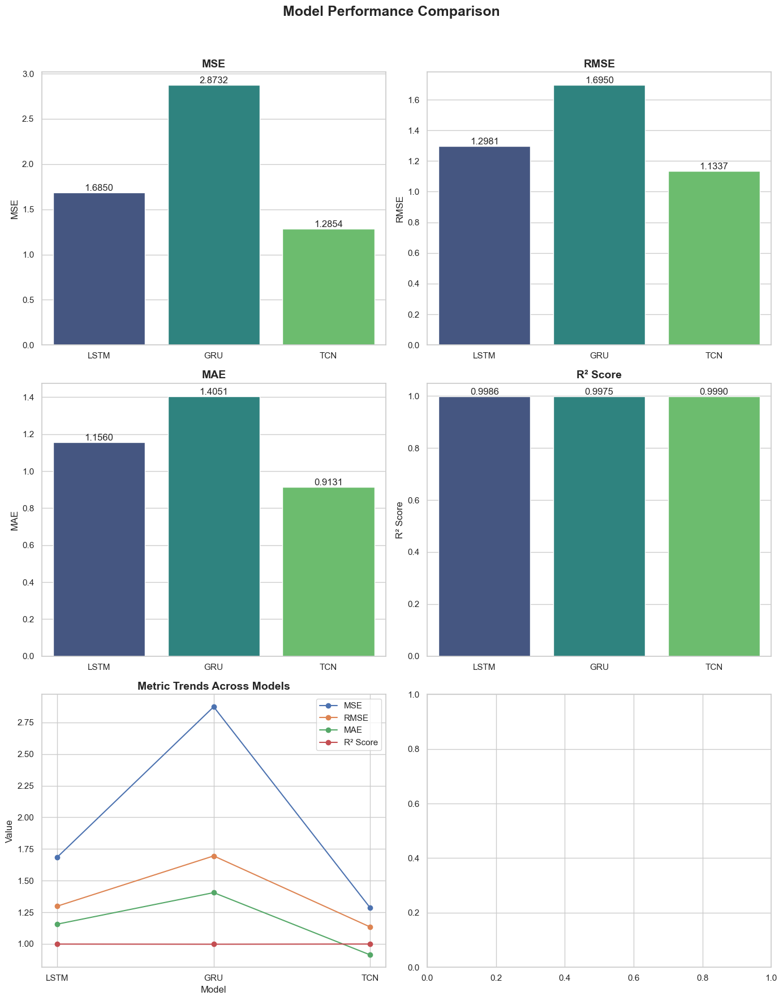

513/513 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step

Horizon: 43
MSE: 1.6850, RMSE: 1.2981, MAE: 1.1560, R² Score: 0.9996

Sample Predictions:
Actual: 147.00, Predicted: 146.00
Actual: 95.00, Predicted: 94.00
Actual: 235.00, Predicted: 233.00
Actual: 271.00, Predicted: 269.00
Actual: 159.00, Predicted: 158.00
Actual: 65.00, Predicted: 65.00
Actual: 142.00, Predicted: 141.00
Actual: 240.00, Predicted: 238.00
Actual: 62.00, Predicted: 62.00
Actual: 289.00, Predicted: 287.00
Actual: 113.00, Predicted: 112.00
Actual: 112.00, Predicted: 111.00
After hba1c
Metrics(hba1c) for 43 minutes: RMSE: 1.2980941785207267, MAE: 1.1560422131397547, R² Score: 0.9995968280938127
Predicted HbA1c: 6.72%
 93/513 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

C:\Users\Muthu\AppData\Local\Temp\ipykernel_7300\226926000.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step

Horizon: 43
MSE: 2.8732, RMSE: 1.6950, MAE: 1.4051, R² Score: 0.9993

Sample Predictions:
Actual: 69.00, Predicted: 68.00
Actual: 134.00, Predicted: 133.00
Actual: 230.00, Predicted: 228.00
Actual: 182.00, Predicted: 180.00
Actual: 121.00, Predicted: 120.00
Actual: 89.00, Predicted: 88.00
Actual: 149.00, Predicted: 148.00
Actual: 153.00, Predicted: 152.00
Actual: 216.00, Predicted: 214.00
Actual: 189.00, Predicted: 187.00
Actual: 273.00, Predicted: 271.00
Actual: 91.00, Predicted: 90.00
After hba1c
Metrics(hba1c) for 43 minutes: RMSE: 1.6950450070114795, MAE: 1.4051119380223267, R² Score: 0.9993125512514417
Predicted HbA1c: 6.71%
 81/513 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

C:\Users\Muthu\AppData\Local\Temp\ipykernel_7300\226926000.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step

Horizon: 43
MSE: 1.2854, RMSE: 1.1337, MAE: 0.9131, R² Score: 0.9997

Sample Predictions:
Actual: 205.00, Predicted: 205.00
Actual: 189.00, Predicted: 188.00
Actual: 228.00, Predicted: 228.00
Actual: 182.00, Predicted: 181.00
Actual: 167.00, Predicted: 166.00
Actual: 309.00, Predicted: 309.00
Actual: 81.00, Predicted: 80.00
Actual: 186.00, Predicted: 185.00
Actual: 230.00, Predicted: 230.00
Actual: 282.00, Predicted: 282.00
Actual: 210.00, Predicted: 210.00
Actual: 185.00, Predicted: 184.00
After hba1c
Metrics(hba1c) for 43 minutes: RMSE: 1.1337396989053667, MAE: 0.9131336546086745, R² Score: 0.9996924579069879
Predicted HbA1c: 6.74%

Processing Training Data...


C:\Users\Muthu\AppData\Local\Temp\ipykernel_7300\226926000.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")



Processing File: E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/540-ws-training.xml
Extracted Weight: 99.0 kg
Time: 2020-05-19 11:36:29, Glucose: 76.00 mg/dL, Fuzzy Output: 0.28, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 11:41:29, Glucose: 72.00 mg/dL, Fuzzy Output: 0.28, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 11:46:29, Glucose: 68.00 mg/dL, Fuzzy Output: 0.27, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 11:51:29, Glucose: 65.00 mg/dL, Fuzzy Output: 0.27, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 11:56:29, Glucose: 63.00 mg/dL, Fuzzy Output: 0.27, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 12:01:29, Glucose: 66.00 mg/dL, Fuzzy Output: 0.27, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 12:06:29, Glucose: 71.00 mg/dL, Fuzzy Output: 0.28, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 12:11:29, Gluco

In [36]:
if __name__ == "__main__":
    main()
